In [39]:
1+1

2

# We are exploring the S&P 500 market index using basic time series analysis techniques just for fun.

We will test the exponential fit by fitting a regression line to the log transform and predict the upcoming cusp as of Mar 30 2024  --- updated Apr 2025


In [40]:
# %pip install yfinance pandas seaborn matplotlib numpy statsmodels scipy scikit-learn dtale ipykernel ipywidgets bokeh jupyter_bokeh pandas_bokeh

In [41]:
# Importing the libraries, setting up the environment and downloading the data

import yfinance as yf
from datetime import date
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
import numpy as np
from sklearn.linear_model import LinearRegression
import dtale
from bokeh.plotting import figure, show, output_file, save
from bokeh.models import ColumnDataSource, NumeralTickFormatter, HoverTool, CrosshairTool
from bokeh.io import output_notebook

#import today's date
today = date.today()



# Setting up boken for jupyter notebook otuput instead of browser
# output_notebook()



# Downloading S&P 500 data from Yahoo Finance
df = yf.download('^GSPC', '1931-01-01', today, auto_adjust=True)

#write df to a csv file
df.to_csv(f'data/{today}_sp500.csv')

#write df to a pickle 
now = pd.Timestamp.now()
df.to_pickle(f'data/{today}_sp500.pkl')




df

[*********************100%***********************]  1 of 1 completed


Price,Close,High,Low,Open,Volume
Ticker,^GSPC,^GSPC,^GSPC,^GSPC,^GSPC
Date,,,,,
1931-01-02,15.850000,15.850000,15.850000,15.850000,0
1931-01-05,15.930000,15.930000,15.930000,15.930000,0
1931-01-06,16.129999,16.129999,16.129999,16.129999,0
1931-01-07,15.090000,15.090000,15.090000,15.090000,0
1931-01-08,16.230000,16.230000,16.230000,16.230000,0
...,...,...,...,...,...
2025-03-31,5611.850098,5627.560059,5488.729980,5527.910156,5257250000
2025-04-01,5633.069824,5650.569824,5558.520020,5597.529785,4434500000


In [42]:
#read the csv file and use the Date column as index
df = pd.read_pickle(f'data/{today}_sp500.pkl')

df['Day']= df.index
# flatten the multiindex
df.columns = df.columns.map(lambda x: x[0] if isinstance(x, tuple) else x)


# df['Day']= df.index
# # convert the datetime index to ordinal values, which can be used to plot a regression line
# df.index = df.index.map(pd.Timestamp.toordinal)

# Logarithmic transformation (assuming positive 'Close' values)
df['Log_Close'] = np.log(df['Close'])  

display(df.iloc[:, :])

,Close,High,Low,Open,Volume,Day,Log_Close
Date,,,,,,,
1931-01-02,15.850000,15.850000,15.850000,15.850000,0,1931-01-02,2.763170
1931-01-05,15.930000,15.930000,15.930000,15.930000,0,1931-01-05,2.768204
1931-01-06,16.129999,16.129999,16.129999,16.129999,0,1931-01-06,2.780681
1931-01-07,15.090000,15.090000,15.090000,15.090000,0,1931-01-07,2.714032
1931-01-08,16.230000,16.230000,16.230000,16.230000,0,1931-01-08,2.786861
...,...,...,...,...,...,...,...
2025-03-31,5611.850098,5627.560059,5488.729980,5527.910156,5257250000,2025-03-31,8.632636
2025-04-01,5633.069824,5650.569824,5558.520020,5597.529785,4434500000,2025-04-01,8.636410
2025-04-02,5670.970215,5695.310059,5571.479980,5580.759766,4243830000,2025-04-02,8.643115


In [43]:
#read the csv file and use the Date column as index
df = pd.read_pickle(f'data/{today}_sp500.pkl')

df['Day']= df.index
# flatten the multiindex
df.columns = df.columns.map(lambda x: x[0] if isinstance(x, tuple) else x)


df['Day']= df.index
# # convert the datetime index to ordinal values, which can be used to plot a regression line
df.index = df.index.map(pd.Timestamp.toordinal)

# Logarithmic transformation (assuming positive 'Close' values)
df['Log_Close'] = np.log(df['Close'])  

display(df.iloc[:, :])

,Close,High,Low,Open,Volume,Day,Log_Close
Date,,,,,,,
704919,15.850000,15.850000,15.850000,15.850000,0,1931-01-02,2.763170
704922,15.930000,15.930000,15.930000,15.930000,0,1931-01-05,2.768204
704923,16.129999,16.129999,16.129999,16.129999,0,1931-01-06,2.780681
704924,15.090000,15.090000,15.090000,15.090000,0,1931-01-07,2.714032
704925,16.230000,16.230000,16.230000,16.230000,0,1931-01-08,2.786861
...,...,...,...,...,...,...,...
739341,5611.850098,5627.560059,5488.729980,5527.910156,5257250000,2025-03-31,8.632636
739342,5633.069824,5650.569824,5558.520020,5597.529785,4434500000,2025-04-01,8.636410
739343,5670.970215,5695.310059,5571.479980,5580.759766,4243830000,2025-04-02,8.643115


## Fitting the regression line

In [44]:
# convert the regression line start date to ordinal
x1 = pd.to_datetime('1932-01-01').toordinal()

# data slice for the regression line
data=df.loc[x1:].reset_index()

# create a linear regression model
model = LinearRegression()

# fit the model
model.fit(data[['Date']], data['Log_Close'])

slope = model.coef_[0]
intercept = model.intercept_
R2 = model.score(data[['Date']], data['Log_Close'])

equation = f'Lin_Regr_Log_Close = {slope:.4f} * Date {'+' if intercept >=0 else ''}{intercept:.4f}'


# make predictions
data['Linear'] = model.predict(data[['Date']])
data['Prediction_of_Close'] = np.exp(data['Linear'])



#print the model details including the slope, intercept, r-squared, and p-value, etc.
print('Slope:', slope)
print('Intercept:', intercept)
print('R-squared:', R2)

equation = f'Lin_Regr_Log_Close = {slope:.4f}*Date{'+' if intercept >=0 else ''}{intercept:.4f}'
print('The equation of the regression line is:', equation)

Slope: 0.0001908348044096269
Intercept: -132.75141365118176
R-squared: 0.9783020394962539
The equation of the regression line is: Lin_Regr_Log_Close = 0.0002*Date-132.7514


In [45]:
#Display the data
display(data.iloc[:, :])

,Date,Close,High,Low,Open,Volume,Day,Log_Close,Linear,Prediction_of_Close
0,705286,7.560000,7.560000,7.560000,7.560000,0,1932-01-04,2.022871,1.841702,6.307265
1,705287,7.550000,7.550000,7.550000,7.550000,0,1932-01-05,2.021548,1.841893,6.308469
2,705288,8.080000,8.080000,8.080000,8.080000,0,1932-01-06,2.089392,1.842084,6.309673
3,705289,8.220000,8.220000,8.220000,8.220000,0,1932-01-07,2.106570,1.842275,6.310877
4,705290,8.570000,8.570000,8.570000,8.570000,0,1932-01-08,2.148268,1.842466,6.312082
...,...,...,...,...,...,...,...,...,...,...
23423,739341,5611.850098,5627.560059,5488.729980,5527.910156,5257250000,2025-03-31,8.632636,8.340581,4190.525723
23424,739342,5633.069824,5650.569824,5558.520020,5597.529785,4434500000,2025-04-01,8.636410,8.340772,4191.325497
23425,739343,5670.970215,5695.310059,5571.479980,5580.759766,4243830000,2025-04-02,8.643115,8.340963,4192.125424
23426,739344,5396.520020,5499.529785,5390.830078,5492.740234,7210470000,2025-04-03,8.593510,8.341154,4192.925504


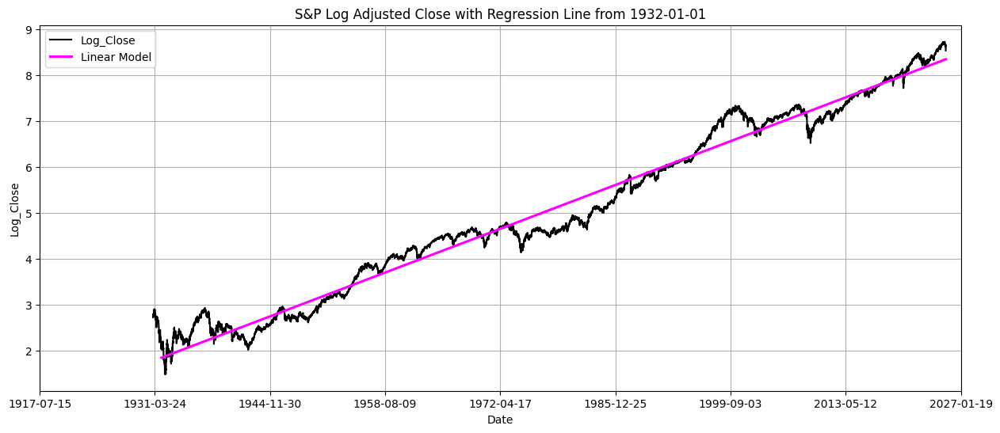

In [46]:

# convert the regression line start date to ordinal
x1 = pd.to_datetime('1932-01-01').toordinal()

# data slice for the regression line
data_sn=df.loc[x1:].reset_index()

# plot the log Close data
ax1 = df.plot(y='Log_Close', c='k', figsize=(15, 6), grid=True, legend=False,
              title='S&P Log Adjusted Close with Regression Line from 1932-01-01')

# add a regression line
sns.regplot(data=data_sn, x='Date', y='Log_Close', ax=ax1, color='magenta', scatter_kws={'s': 7}, label='Linear Model', scatter=False)

ax1.set_xlim(df.index[0], df.index[-1])

# convert the axis back to datetime
xticks = ax1.get_xticks()
labels = [pd.Timestamp.fromordinal(int(label)).date() for label in xticks]
ax1.set_xticks(xticks)
ax1.set_xticklabels(labels)

ax1.legend()

plt.show()

Plot in seaborn

## Making a dynamic version of the plot using Bokeh

In [47]:
display(data.iloc[:, :])

,Date,Close,High,Low,Open,Volume,Day,Log_Close,Linear,Prediction_of_Close
0,705286,7.560000,7.560000,7.560000,7.560000,0,1932-01-04,2.022871,1.841702,6.307265
1,705287,7.550000,7.550000,7.550000,7.550000,0,1932-01-05,2.021548,1.841893,6.308469
2,705288,8.080000,8.080000,8.080000,8.080000,0,1932-01-06,2.089392,1.842084,6.309673
3,705289,8.220000,8.220000,8.220000,8.220000,0,1932-01-07,2.106570,1.842275,6.310877
4,705290,8.570000,8.570000,8.570000,8.570000,0,1932-01-08,2.148268,1.842466,6.312082
...,...,...,...,...,...,...,...,...,...,...
23423,739341,5611.850098,5627.560059,5488.729980,5527.910156,5257250000,2025-03-31,8.632636,8.340581,4190.525723
23424,739342,5633.069824,5650.569824,5558.520020,5597.529785,4434500000,2025-04-01,8.636410,8.340772,4191.325497
23425,739343,5670.970215,5695.310059,5571.479980,5580.759766,4243830000,2025-04-02,8.643115,8.340963,4192.125424
23426,739344,5396.520020,5499.529785,5390.830078,5492.740234,7210470000,2025-04-03,8.593510,8.341154,4192.925504


In [48]:
# adding column selection to the plot_regression_line function
def plot_regression_line(data, equation, title='S&P 500 Index (1931-2024)', cols=['Day', 'Log_Close', 'Linear'], if_notebook=True, if_save=False, filename='Regression_Line.html'):
    # Create a new figure
    p = figure(title=title, x_axis_label='Year', y_axis_label='Log S&P 500 Index', width=1000, height=600, x_axis_type='datetime')

    # Define the source variable
    source = ColumnDataSource(data=data)

    # Define the colors for the lines
    colors = ['blue', 'red', 'green', 'orange', 'purple']  # Add more colors if needed

    # Plot the lines
    for i in range(1, len(cols)):
        p.line(x=cols[0], y=cols[i], source=source, line_width=2, legend_label=cols[i], color=colors[i-1])  # Use different color for each line

    # Add hover functionality from the list of columns
    tooltips = [(cols[0], '@' + cols[0] + '{%F}')]
    for i in range(1, len(cols)):
        tooltips.extend([(cols[i], '@' + cols[i] + '{0,0.00}')])
    hover_tool = HoverTool(tooltips=tooltips, formatters={'@' + cols[0]: 'datetime'})

    # hover_tool = HoverTool(tooltips=[('Year', '@' + cols[0] + '{%F}'), (cols[1], '@' + cols[1] + '{0,0.00}'), (cols[2], '@' + cols[2] + '{0,0.00}')], formatters={'@' + cols[0]: 'datetime'})
    p.add_tools(hover_tool)

    # Add the equation of the regression line
    # p.text(x=400 , y=0.5, text=[equation], text_font_size='18pt', text_align='center')

    # Format the y-axis tick labels
    p.yaxis.formatter = NumeralTickFormatter(format='0,0.00')

    # Relocate the legend to top left
    p.legend.location = 'top_left'

    

    # Show the plot
    if if_notebook:
        output_notebook()
        show(p)
    else:
        show(p)

    # Save the plot
    if if_save:
        output_file(filename, title=title)
        save(p)
        print(f'The plot is saved as {filename}.')
    else:
        print('The plot is displayed in the notebook.')

    return p


plot_regression_line(data, equation, title='S&P 500 Index (1931-2024)', cols=['Day', 'Log_Close', 'Linear'], if_notebook=True, if_save=False, filename='Regression_Line.html')



Loading BokehJS ...

The plot is displayed in the notebook.


figure(id='p2216', ...)

We extend daily till year_future year and predict 

In [49]:
data['Day'].max()
plot_regression_line(data.loc[data['Day'] >= pd.to_datetime('1950-01-01')], equation, title='S&P 500 Index (1931-2024)', cols=['Day', 'Log_Close', 'Linear'])

Loading BokehJS ...

The plot is displayed in the notebook.


figure(id='p2303', ...)

In [50]:
#We extend daily intil the year year_future forward  
# create a new dataframe for the future dates
day = 1  # Define the value of 'day' variable here

year_future = 2030

# convert the 'Day' column to datetime
data['Day'] = pd.to_datetime(data['Day'])

delta_years = year_future - data['Day'].max().year
future_dates = pd.date_range(start=data['Day'].max()+pd.DateOffset(days=1) , periods=delta_years*365, freq='D')


print(future_dates)

# convert the future dates to ordinal
future_dates_od = future_dates.map(pd.Timestamp.toordinal)
print(future_dates_od)

# convert future_dates to a numpy array
future_dates_od_np = np.array(future_dates_od)
print(future_dates_od_np)


#create a new dataframe for the future dates and add above 3 columns
future_data = pd.DataFrame(future_dates, columns=['Day'])
future_data['Day_od'] = future_dates_od

#predict the S&P 500 index using the linear regression model and add to the dataframe
future_data['Linear'] = model.predict(future_dates_od_np.reshape(-1, 1))
future_data['Prediction_of_Close'] = np.exp(future_data['Linear'])

future_data.index=future_data['Day_od']

display(future_data.iloc[:, :])

DatetimeIndex(['2025-04-05', '2025-04-06', '2025-04-07', '2025-04-08',
               '2025-04-09', '2025-04-10', '2025-04-11', '2025-04-12',
               '2025-04-13', '2025-04-14',
               ...
               '2030-03-25', '2030-03-26', '2030-03-27', '2030-03-28',
               '2030-03-29', '2030-03-30', '2030-03-31', '2030-04-01',
               '2030-04-02', '2030-04-03'],
              dtype='datetime64[ns]', length=1825, freq='D')
Index([739346, 739347, 739348, 739349, 739350, 739351, 739352, 739353, 739354,
       739355,
       ...
       741161, 741162, 741163, 741164, 741165, 741166, 741167, 741168, 741169,
       741170],
      dtype='int64', length=1825)
[739346 739347 739348 ... 741168 741169 741170]


c:\0_Code\Market-main\.venv\Lib\site-packages\sklearn\utils\validation.py:2739: UserWarning:

X does not have valid feature names, but LinearRegression was fitted with feature names



,Day,Day_od,Linear,Prediction_of_Close
Day_od,,,,
739346,2025-04-05,739346,8.341536,4194.526122
739347,2025-04-06,739347,8.341726,4195.326660
739348,2025-04-07,739348,8.341917,4196.127350
739349,2025-04-08,739349,8.342108,4196.928194
739350,2025-04-09,739350,8.342299,4197.729190
...,...,...,...,...
741166,2030-03-30,741166,8.688855,5936.381157
741167,2030-03-31,741167,8.689046,5937.514133
741168,2030-04-01,741168,8.689237,5938.647326


In [51]:
# Concatenate the original data frame and the future data frame
extended_df = pd.concat([df, future_data[['Day', 'Prediction_of_Close']]])

# add day ordinal to the extended dataframe
extended_df['Day_od'] = extended_df['Day'].apply(pd.to_datetime).apply(pd.Timestamp.toordinal)

# add the regression line to the extended dataframe
extended_df['Linear'] = model.predict(np.array(extended_df[['Day_od']]).reshape(-1, 1))

# add the prediction of the close to the extended dataframe
extended_df['Prediction_of_Close'] = np.exp(extended_df['Linear'])

# Display the extended data frame
display(extended_df.iloc[:, :])

c:\0_Code\Market-main\.venv\Lib\site-packages\sklearn\utils\validation.py:2739: UserWarning:

X does not have valid feature names, but LinearRegression was fitted with feature names



,Close,High,Low,Open,Volume,Day,Log_Close,Prediction_of_Close,Day_od,Linear
704919,15.850000,15.850000,15.850000,15.850000,0.0,1931-01-02,2.763170,5.880641,704919,1.771666
704922,15.930000,15.930000,15.930000,15.930000,0.0,1931-01-05,2.768204,5.884009,704922,1.772238
704923,16.129999,16.129999,16.129999,16.129999,0.0,1931-01-06,2.780681,5.885132,704923,1.772429
704924,15.090000,15.090000,15.090000,15.090000,0.0,1931-01-07,2.714032,5.886255,704924,1.772620
704925,16.230000,16.230000,16.230000,16.230000,0.0,1931-01-08,2.786861,5.887379,704925,1.772811
...,...,...,...,...,...,...,...,...,...,...
741166,NaN,NaN,NaN,NaN,NaN,2030-03-30,NaN,5936.381157,741166,8.688855
741167,NaN,NaN,NaN,NaN,NaN,2030-03-31,NaN,5937.514133,741167,8.689046
741168,NaN,NaN,NaN,NaN,NaN,2030-04-01,NaN,5938.647326,741168,8.689237
741169,NaN,NaN,NaN,NaN,NaN,2030-04-02,NaN,5939.780735,741169,8.689427


In [52]:
# Show data +- 5 days from today
delta_days = 5

date_range = (extended_df['Day'] > pd.to_datetime(today) - pd.DateOffset(days=delta_days)) & (extended_df['Day'] < pd.to_datetime(today) + pd.DateOffset(days=delta_days))

display(extended_df.loc[date_range].iloc[:, :])



,Close,High,Low,Open,Volume,Day,Log_Close,Prediction_of_Close,Day_od,Linear
739342,5633.069824,5650.569824,5558.520020,5597.529785,4.434500e+09,2025-04-01,8.636410,4191.325497,739342,8.340772
739343,5670.970215,5695.310059,5571.479980,5580.759766,4.243830e+09,2025-04-02,8.643115,4192.125424,739343,8.340963
739344,5396.520020,5499.529785,5390.830078,5492.740234,7.210470e+09,2025-04-03,8.593510,4192.925504,739344,8.341154
739345,5074.080078,5292.140137,5069.899902,5292.140137,8.853500e+09,2025-04-04,8.531901,4193.725736,739345,8.341345
739346,NaN,NaN,NaN,NaN,NaN,2025-04-05,NaN,4194.526122,739346,8.341536
739347,NaN,NaN,NaN,NaN,NaN,2025-04-06,NaN,4195.326660,739347,8.341726
739348,NaN,NaN,NaN,NaN,NaN,2025-04-07,NaN,4196.127350,739348,8.341917
739349,NaN,NaN,NaN,NaN,NaN,2025-04-08,NaN,4196.928194,739349,8.342108
739350,NaN,NaN,NaN,NaN,NaN,2025-04-09,NaN,4197.729190,739350,8.342299


In [53]:
#display the data from 1950 to 2026
data_1950_2026 = extended_df.loc[extended_df['Day'] >= pd.to_datetime('1950-01-01')]
display(data_1950_2026.iloc[:, :])
plot_regression_line(data_1950_2026, equation, title='S&P 500 Index (1931-2024)', cols=['Day', 'Log_Close', 'Linear'])

,Close,High,Low,Open,Volume,Day,Log_Close,Prediction_of_Close,Day_od,Linear
711860,16.66,16.66,16.66,16.66,1260000.0,1950-01-03,2.813011,22.114870,711860,3.096250
711861,16.85,16.85,16.85,16.85,1890000.0,1950-01-04,2.824351,22.119090,711861,3.096441
711862,16.93,16.93,16.93,16.93,2550000.0,1950-01-05,2.829087,22.123312,711862,3.096632
711863,16.98,16.98,16.98,16.98,2010000.0,1950-01-06,2.832036,22.127534,711863,3.096823
711866,17.08,17.08,17.08,17.08,2520000.0,1950-01-09,2.837908,22.140206,711866,3.097395
...,...,...,...,...,...,...,...,...,...,...
741166,NaN,NaN,NaN,NaN,NaN,2030-03-30,NaN,5936.381157,741166,8.688855
741167,NaN,NaN,NaN,NaN,NaN,2030-03-31,NaN,5937.514133,741167,8.689046
741168,NaN,NaN,NaN,NaN,NaN,2030-04-01,NaN,5938.647326,741168,8.689237
741169,NaN,NaN,NaN,NaN,NaN,2030-04-02,NaN,5939.780735,741169,8.689427


Loading BokehJS ...

The plot is displayed in the notebook.


figure(id='p2390', ...)

In [54]:
# plotting the extended data frame using the plot_regression_line function
plot_regression_line(extended_df, equation, title=f'S&P 500 Index (1931-{year_future})', cols = ['Day', 'Close', 'Prediction_of_Close'], if_save=False, filename='Prediction_2030_S&P_500_Index.html')


Loading BokehJS ...

The plot is displayed in the notebook.


figure(id='p2478', ...)

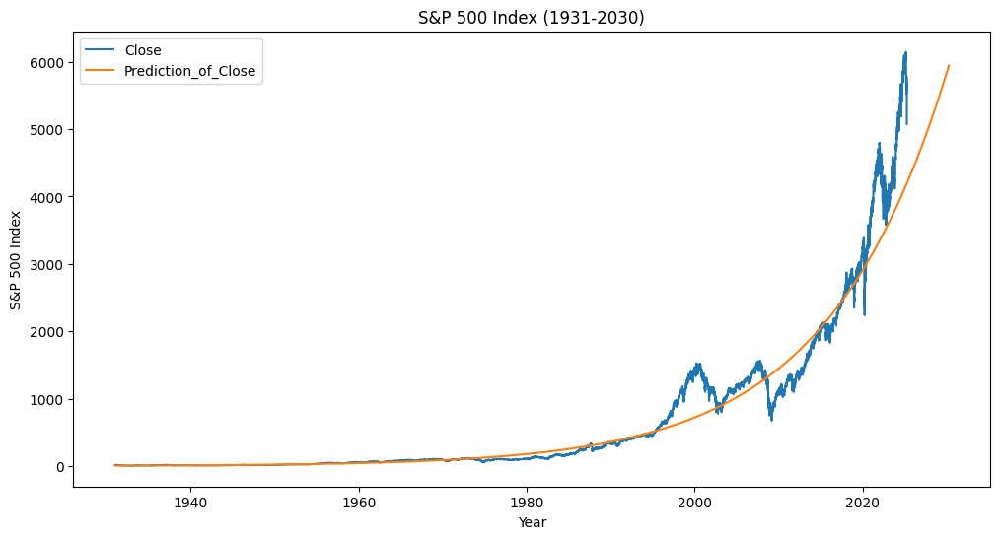

In [55]:
# plot the original data and the extended data
plt.figure(figsize=(12, 6))
sns.lineplot(x='Day', y='Close', data=extended_df, label='Close')
sns.lineplot(x='Day', y='Prediction_of_Close', data=extended_df, label='Prediction_of_Close')
plt.title(f'S&P 500 Index (1931-{year_future})')
plt.xlabel('Year')
plt.ylabel('S&P 500 Index')
plt.legend()
plt.show()


In [56]:
# D-Tale
d = dtale.show(df, host='localhost')   

## The Slope from 2009 looks different, let's fit a linear regression model to the data from 2009 to 2024

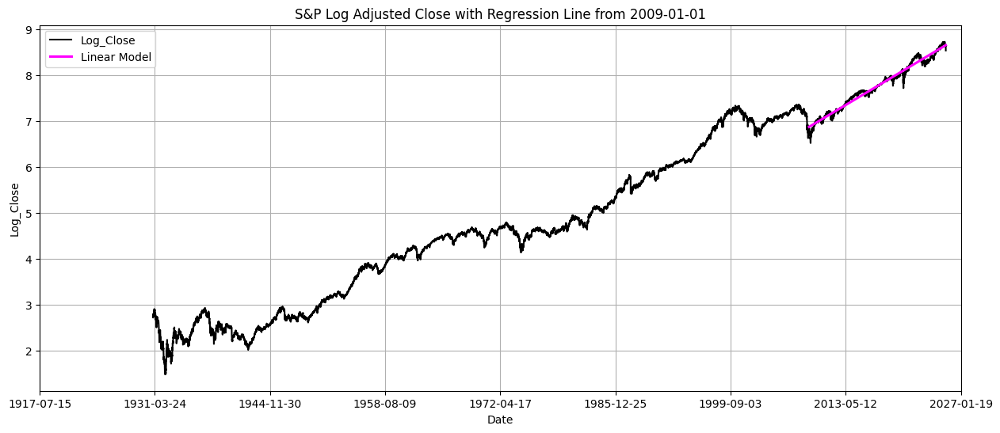

In [57]:


# convert the regression line start date to ordinal
x1 = pd.to_datetime('2009-01-01').toordinal()

# data slice for the regression line
data=df.loc[x1:].reset_index()

# plot the log Close data
ax1 = df.plot(y='Log_Close', c='k', figsize=(15, 6), grid=True, legend=False,
              title='S&P Log Adjusted Close with Regression Line from 2009-01-01')

# add a regression line
sns.regplot(data=data, x='Date', y='Log_Close', ax=ax1, color='magenta', scatter_kws={'s': 7}, label='Linear Model', scatter=False)

ax1.set_xlim(df.index[0], df.index[-1])

# convert the axis back to datetime
xticks = ax1.get_xticks()
labels = [pd.Timestamp.fromordinal(int(label)).date() for label in xticks]
ax1.set_xticks(xticks)
ax1.set_xticklabels(labels)

ax1.legend()

plt.show()


In [58]:
extended_df

,Close,High,Low,Open,Volume,Day,Log_Close,Prediction_of_Close,Day_od,Linear
704919,15.850000,15.850000,15.850000,15.850000,0.0,1931-01-02,2.763170,5.880641,704919,1.771666
704922,15.930000,15.930000,15.930000,15.930000,0.0,1931-01-05,2.768204,5.884009,704922,1.772238
704923,16.129999,16.129999,16.129999,16.129999,0.0,1931-01-06,2.780681,5.885132,704923,1.772429
704924,15.090000,15.090000,15.090000,15.090000,0.0,1931-01-07,2.714032,5.886255,704924,1.772620
704925,16.230000,16.230000,16.230000,16.230000,0.0,1931-01-08,2.786861,5.887379,704925,1.772811
...,...,...,...,...,...,...,...,...,...,...
741166,NaN,NaN,NaN,NaN,NaN,2030-03-30,NaN,5936.381157,741166,8.688855
741167,NaN,NaN,NaN,NaN,NaN,2030-03-31,NaN,5937.514133,741167,8.689046
741168,NaN,NaN,NaN,NaN,NaN,2030-04-01,NaN,5938.647326,741168,8.689237
741169,NaN,NaN,NaN,NaN,NaN,2030-04-02,NaN,5939.780735,741169,8.689427


In [59]:
# Chunk the extended data frame starting from 2009-05-01 
df_2009 = extended_df.loc[extended_df['Day'] >= pd.to_datetime('2009-05-01')]

#truncate df_2009 to the last day we have data in the close column  
df_2009 = df_2009.loc[df_2009['Close'].notnull()]


# Build a regression model to the log
model_2009 = LinearRegression()
model_2009.fit(df_2009[['Day_od']], df_2009['Log_Close'])

# Predict the close using the regression model
df_2009['2009_regr'] = np.exp(model_2009.predict(df_2009[['Day_od']]))

# Display the chunked data frame with the 2009_regr column for close
display(df_2009)


,Close,High,Low,Open,Volume,Day,Log_Close,Prediction_of_Close,Day_od,Linear,2009_regr
733528,877.520020,880.479980,866.099976,872.739990,5.312170e+09,2009-05-01,6.777100,1381.960964,733528,7.231259,1011.849493
733531,907.239990,907.849976,879.210022,879.210022,7.038840e+09,2009-05-04,6.810407,1382.752369,733531,7.231831,1012.748123
733532,903.799988,907.700012,897.340027,906.099976,6.882860e+09,2009-05-05,6.806608,1383.016272,733532,7.232022,1013.047844
733533,919.530029,920.280029,903.950012,903.950012,8.555040e+09,2009-05-06,6.823863,1383.280224,733533,7.232213,1013.347653
733534,907.390015,929.580017,901.359985,919.580017,9.120100e+09,2009-05-07,6.810572,1383.544228,733534,7.232404,1013.647551
...,...,...,...,...,...,...,...,...,...,...,...
739341,5611.850098,5627.560059,5488.729980,5527.910156,5.257250e+09,2025-03-31,8.632636,4190.525723,739341,8.340581,5651.213123
739342,5633.069824,5650.569824,5558.520020,5597.529785,4.434500e+09,2025-04-01,8.636410,4191.325497,739342,8.340772,5652.885588
739343,5670.970215,5695.310059,5571.479980,5580.759766,4.243830e+09,2025-04-02,8.643115,4192.125424,739343,8.340963,5654.558547
739344,5396.520020,5499.529785,5390.830078,5492.740234,7.210470e+09,2025-04-03,8.593510,4192.925504,739344,8.341154,5656.232002


In [60]:
#lets add 2009_regr to the extended_df
extended_df['2009_regr_prediction'] = np.exp(model_2009.predict(extended_df[['Day_od']]))

extended_df['2009_regr_linear'] = model_2009.predict(extended_df[['Day_od']])
display(extended_df)


,Close,High,Low,Open,Volume,Day,Log_Close,Prediction_of_Close,Day_od,Linear,2009_regr_prediction,2009_regr_linear
704919,15.850000,15.850000,15.850000,15.850000,0.0,1931-01-02,2.763170,5.880641,704919,1.771666,0.213102,-1.545985
704922,15.930000,15.930000,15.930000,15.930000,0.0,1931-01-05,2.768204,5.884009,704922,1.772238,0.213291,-1.545097
704923,16.129999,16.129999,16.129999,16.129999,0.0,1931-01-06,2.780681,5.885132,704923,1.772429,0.213354,-1.544801
704924,15.090000,15.090000,15.090000,15.090000,0.0,1931-01-07,2.714032,5.886255,704924,1.772620,0.213417,-1.544505
704925,16.230000,16.230000,16.230000,16.230000,0.0,1931-01-08,2.786861,5.887379,704925,1.772811,0.213481,-1.544209
...,...,...,...,...,...,...,...,...,...,...,...,...
741166,NaN,NaN,NaN,NaN,NaN,2030-03-30,NaN,5936.381157,741166,8.688855,9697.762354,9.179650
741167,NaN,NaN,NaN,NaN,NaN,2030-03-31,NaN,5937.514133,741167,8.689046,9700.632386,9.179946
741168,NaN,NaN,NaN,NaN,NaN,2030-04-01,NaN,5938.647326,741168,8.689237,9703.503267,9.180242
741169,NaN,NaN,NaN,NaN,NaN,2030-04-02,NaN,5939.780735,741169,8.689427,9706.374998,9.180538


In [61]:
# plot the exetennded data frame with the 2009_regr column using the plot_regression_line function
plot_regression_line(extended_df, equation, title=f'S&P 500 Index (1931-{year_future})', cols=['Day', 'Close', 'Prediction_of_Close', '2009_regr_prediction'],if_notebook=True, if_save=False, filename='Prediction_2030_S&P_500_Index.html')

Loading BokehJS ...

The plot is displayed in the notebook.


figure(id='p2566', ...)

In [62]:
#calculate percentage of yearly growth of the S&P 500 index per year for 3 different coumns close, prediction_of_close and 2009_regr_prediction
# calculate the percentage of yearly growth
extended_df['Close_pct'] = extended_df['Close'].pct_change() * 100
extended_df['Prediction_of_Close_pct'] = extended_df['Prediction_of_Close'].pct_change() * 100
extended_df['2009_regr_prediction_pct'] = extended_df['2009_regr_prediction'].pct_change() * 100

# Display the extended data frame with the percentage columns
display(extended_df.iloc[:, :])



C:\Users\norayr\AppData\Local\Temp\ipykernel_167092\3565321510.py:3: FutureWarning:

The default fill_method='pad' in Series.pct_change is deprecated and will be removed in a future version. Either fill in any non-leading NA values prior to calling pct_change or specify 'fill_method=None' to not fill NA values.



,Close,High,Low,Open,Volume,Day,Log_Close,Prediction_of_Close,Day_od,Linear,2009_regr_prediction,2009_regr_linear,Close_pct,Prediction_of_Close_pct,2009_regr_prediction_pct
704919,15.850000,15.850000,15.850000,15.850000,0.0,1931-01-02,2.763170,5.880641,704919,1.771666,0.213102,-1.545985,NaN,NaN,NaN
704922,15.930000,15.930000,15.930000,15.930000,0.0,1931-01-05,2.768204,5.884009,704922,1.772238,0.213291,-1.545097,0.504731,0.057267,0.088811
704923,16.129999,16.129999,16.129999,16.129999,0.0,1931-01-06,2.780681,5.885132,704923,1.772429,0.213354,-1.544801,1.255486,0.019085,0.029595
704924,15.090000,15.090000,15.090000,15.090000,0.0,1931-01-07,2.714032,5.886255,704924,1.772620,0.213417,-1.544505,-6.447607,0.019085,0.029595
704925,16.230000,16.230000,16.230000,16.230000,0.0,1931-01-08,2.786861,5.887379,704925,1.772811,0.213481,-1.544209,7.554668,0.019085,0.029595
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
741166,NaN,NaN,NaN,NaN,NaN,2030-03-30,NaN,5936.381157,741166,8.688855,9697.762354,9.179650,0.000000,0.019085,0.029595
741167,NaN,NaN,NaN,NaN,NaN,2030-03-31,NaN,5937.514133,741167,8.689046,9700.632386,9.179946,0.000000,0.019085,0.029595
741168,NaN,NaN,NaN,NaN,NaN,2030-04-01,NaN,5938.647326,741168,8.689237,9703.503267,9.180242,0.000000,0.019085,0.029595
741169,NaN,NaN,NaN,NaN,NaN,2030-04-02,NaN,5939.780735,741169,8.689427,9706.374998,9.180538,0.000000,0.019085,0.029595


In [63]:
#show data using dtale
d = dtale.show(extended_df, host='localhost')


In [77]:
extended_df
print(extended_df.loc[extended_df["Day"] == "2026-01-01", "Prediction_of_Close"].values[:])

[4417.15844177]


In [79]:
# print yearly growth of the S&P 500 index per year in 2023 for 3 different columns close, prediction_of_close and 2009_regr_prediction
year_future = 2025

print(f'Yearly growth of the S&P 500 index per year in {year_future} for 3 different columns:')
print(f'Prediction_of_Close: {extended_df.loc[extended_df["Day"] == "2026-01-01", "Prediction_of_Close"].values[0]/extended_df.loc[extended_df["Day"] == "2026-01-01", "Prediction_of_Close"].values[0]:.2f}%')

print(f'Prediction_of_Close: {extended_df.loc[extended_df["Day"] == "2027-01-01", "Prediction_of_Close"].values[0]}')
print(f'Prediction_of_Close: {extended_df.loc[extended_df["Day"] == "2026-01-01", "Prediction_of_Close"].values[0]}')

print(f'2009_regr_prediction: {extended_df.loc[extended_df["Day"] == "2027-01-01", "2009_regr_prediction"].values[0]}')
print(f'2009_regr_prediction: {extended_df.loc[extended_df["Day"] == "2026-01-01", "2009_regr_prediction"].values[0]}')

print(f'Prediction_of_Close: {100*extended_df.loc[extended_df["Day"] == "2026-01-01", "2009_regr_prediction"].values[0]/extended_df.loc[extended_df["Day"] == "2026-01-01", "2009_regr_prediction"].values[0]:.2f}%')

print(extended_df.loc[extended_df["Day"] == "2023-02-01", "Close"])
print(extended_df.loc[extended_df["Day"] == "2024-02-01", "Close"])

print(f'Close: {100*extended_df.loc[extended_df["Day"] == "2023-02-01", "Close"].values[0]/extended_df.loc[extended_df["Day"] == "2024-02-01", "Close"].values[0]:.2f}%')




Yearly growth of the S&P 500 index per year in 2025 for 3 different columns:
Prediction_of_Close: 1.00%
Prediction_of_Close: 4735.803028641507
Prediction_of_Close: 4417.158441765586
2009_regr_prediction: 6831.503268309218
2009_regr_prediction: 6132.11527225441
Prediction_of_Close: 100.00%
738552    4119.209961
Name: Close, dtype: float64
738917    4906.189941
Name: Close, dtype: float64
Close: 83.96%


## We will be calculating left and right gradient quitoents

### check a slice of data in range of delta_days from today


In [80]:
# check a slice of data in range of delta_days from today

df_2 = df.copy().sort_index(ascending=True)

print(df_2.shape)

# display df_2 for 5 days before and after today
delta_days = 5
# date_range = (df_2.Day > pd.to_datetime(today) - pd.DateOffset(days=delta_days)) & (df_2.Day < pd.to_datetime(today) + pd.DateOffset(days=delta_days))

date_range = (df_2.Day > pd.to_datetime(today) - pd.DateOffset(days=delta_days)) & (df_2.Day < pd.to_datetime(today) + pd.DateOffset(days=delta_days))

print(pd.to_datetime(today) - pd.DateOffset(days=delta_days))
print(pd.to_datetime(today) + pd.DateOffset(days=delta_days))


print(df_2[df_2.Day > pd.to_datetime(today) - pd.DateOffset(days=delta_days)])

print(date_range.sum())

# display(df_2.loc[date_range].iloc[:, :])


(23680, 7)
2025-03-31 00:00:00
2025-04-10 00:00:00
              Close         High          Low         Open      Volume  \
Date                                                                     
739342  5633.069824  5650.569824  5558.520020  5597.529785  4434500000   
739343  5670.970215  5695.310059  5571.479980  5580.759766  4243830000   
739344  5396.520020  5499.529785  5390.830078  5492.740234  7210470000   
739345  5074.080078  5292.140137  5069.899902  5292.140137  8853500000   

              Day  Log_Close  
Date                          
739342 2025-04-01   8.636410  
739343 2025-04-02   8.643115  
739344 2025-04-03   8.593510  
739345 2025-04-04   8.531901  
4


### Calculating the right gradient quotient, first will caclulate the minimum from the day forward

In [81]:


# spot check for a random index
i=10000

print ('i = ',i, '\n', df_2.loc[df_2.index[i], :], '\n ',)


print(df_2['Close'][i:].shape ,'\n ' , df_2['Close'][i:].min() ) 

#print the index of the min value and double check
print(df_2['Close'][i:].idxmin())
print(df_2.loc[720899,'Close'])

#print the index of the max prior value and double check
print(df_2['Close'][:i].shape ,'\n ' , df_2['Close'][:i].max() )
print(df_2['Close'][:i].idxmax())
print(df_2.loc[718765,'Close'])



# calcualte the number of days between the i and the min value using the day column
print(df_2.Day.iloc[i])
print(df_2.Day.loc[720899])


# print the number of days between the i and the min value using the day column
print((df_2.Day.loc[720899] - df_2.Day.iloc[i]).days)

# calcualte the number of days between the i and the max value using the day column
print((df_2.Day.loc[718765] - df_2.Day.iloc[i]).days)




i =  10000 
 Close                  91.800003
High                   92.279999
Low                    90.690002
Open                         0.0
Volume                  12600000
Day          1971-01-05 00:00:00
Log_Close               4.519612
Name: 719532, dtype: object 
 
(13680,) 
  62.279998779296875
720899
62.279998779296875
(10000,) 
  108.37000274658203
718765
108.37000274658203
1971-01-05 00:00:00
1974-10-03 00:00:00
1367
-767


In [82]:
# add the min and max columns to the dataframe


# add a column for each day of close, calculate the min of the close column 
# # starting next day and till the end of the dataframe
# # add a column for each day of close, calculate the max of the close column for all days before the current day


for i in range(1, len(df_2)):
    df_2.loc[df_2.index[i], 'Min_After_Close'] = df_2['Close'][i:].min()
    #add the date the min was found
    df_2.loc[df_2.index[i], 'Min_After_Close_Date'] = df_2[df_2['Close'] == df_2['Close'][i:].min()]['Day'].min().date()
    #the number of days between the i and the min value using the day column
    df_2.loc[df_2.index[i], 'Days_to_Min'] = (df_2['Day'].loc[df_2['Close'] == df_2['Close'][i:].min()].min() - df_2['Day'].iloc[i]).days

    df_2.loc[df_2.index[i], 'Max_Prior_Close'] = df_2['Close'][:i].max()
    #add the date the max was found, use the Day column to get the date
    df_2.loc[df_2.index[i], 'Max_Prior_Close_Date'] = df_2[df_2['Close'] == df_2['Close'][:i].max()]['Day'].min().date()
    # add the number of days between the i and the max value using the day column
    df_2.loc[df_2.index[i], 'Days_to_Max'] = (df_2['Day'].loc[df_2['Close'] == df_2['Close'][:i].max()].min() - df_2['Day'].iloc[i]).days

display(df_2.tail(10))



,Close,High,Low,Open,Volume,Day,Log_Close,Min_After_Close,Min_After_Close_Date,Days_to_Min,Max_Prior_Close,Max_Prior_Close_Date,Days_to_Max
Date,,,,,,,,,,,,,
739334,5767.569824,5775.140137,5718.080078,5718.080078,4517990000,2025-03-24,8.660006,5074.080078,2025-04-04,11.0,6144.149902,2025-02-19,-33.0
739335,5776.649902,5786.950195,5760.419922,5775.959961,4467340000,2025-03-25,8.661579,5074.080078,2025-04-04,10.0,6144.149902,2025-02-19,-34.0
739336,5712.200195,5783.620117,5694.410156,5771.660156,4183140000,2025-03-26,8.650360,5074.080078,2025-04-04,9.0,6144.149902,2025-02-19,-35.0
739337,5693.310059,5732.279785,5670.939941,5695.640137,4403460000,2025-03-27,8.647047,5074.080078,2025-04-04,8.0,6144.149902,2025-02-19,-36.0
739338,5580.939941,5685.890137,5572.419922,5679.200195,4513330000,2025-03-28,8.627112,5074.080078,2025-04-04,7.0,6144.149902,2025-02-19,-37.0
739341,5611.850098,5627.560059,5488.729980,5527.910156,5257250000,2025-03-31,8.632636,5074.080078,2025-04-04,4.0,6144.149902,2025-02-19,-40.0
739342,5633.069824,5650.569824,5558.520020,5597.529785,4434500000,2025-04-01,8.636410,5074.080078,2025-04-04,3.0,6144.149902,2025-02-19,-41.0
739343,5670.970215,5695.310059,5571.479980,5580.759766,4243830000,2025-04-02,8.643115,5074.080078,2025-04-04,2.0,6144.149902,2025-02-19,-42.0
739344,5396.520020,5499.529785,5390.830078,5492.740234,7210470000,2025-04-03,8.593510,5074.080078,2025-04-04,1.0,6144.149902,2025-02-19,-43.0


In [83]:
display(df_2.tail(10))


,Close,High,Low,Open,Volume,Day,Log_Close,Min_After_Close,Min_After_Close_Date,Days_to_Min,Max_Prior_Close,Max_Prior_Close_Date,Days_to_Max
Date,,,,,,,,,,,,,
739334,5767.569824,5775.140137,5718.080078,5718.080078,4517990000,2025-03-24,8.660006,5074.080078,2025-04-04,11.0,6144.149902,2025-02-19,-33.0
739335,5776.649902,5786.950195,5760.419922,5775.959961,4467340000,2025-03-25,8.661579,5074.080078,2025-04-04,10.0,6144.149902,2025-02-19,-34.0
739336,5712.200195,5783.620117,5694.410156,5771.660156,4183140000,2025-03-26,8.650360,5074.080078,2025-04-04,9.0,6144.149902,2025-02-19,-35.0
739337,5693.310059,5732.279785,5670.939941,5695.640137,4403460000,2025-03-27,8.647047,5074.080078,2025-04-04,8.0,6144.149902,2025-02-19,-36.0
739338,5580.939941,5685.890137,5572.419922,5679.200195,4513330000,2025-03-28,8.627112,5074.080078,2025-04-04,7.0,6144.149902,2025-02-19,-37.0
739341,5611.850098,5627.560059,5488.729980,5527.910156,5257250000,2025-03-31,8.632636,5074.080078,2025-04-04,4.0,6144.149902,2025-02-19,-40.0
739342,5633.069824,5650.569824,5558.520020,5597.529785,4434500000,2025-04-01,8.636410,5074.080078,2025-04-04,3.0,6144.149902,2025-02-19,-41.0
739343,5670.970215,5695.310059,5571.479980,5580.759766,4243830000,2025-04-02,8.643115,5074.080078,2025-04-04,2.0,6144.149902,2025-02-19,-42.0
739344,5396.520020,5499.529785,5390.830078,5492.740234,7210470000,2025-04-03,8.593510,5074.080078,2025-04-04,1.0,6144.149902,2025-02-19,-43.0


### putting it all together into a function

In [84]:
# add a column for each day of close, calculate the min of the close column 
#     starting next day and till the end of the dataframe
#     add a column for each day of close, calculate the max of the close column for all days before the current day
#     add a column for the number of days from the current day to the day the min was found
#     add a column for the number of days from the current day to the day the max was found

# let's put the above code in a function

def min_max_close(df):
    '''
    add a column for each day of close, calculate the min of the close column 
    starting next day and till the end of the dataframe
    add a column for each day of close, calculate the max of the close column for all days before the current day
    add a column for the number of days from the current day to the day the min was found
    add a column for the number of days from the current day to the day the max was found
    '''
    for i in range(1, len(df)):
        df.loc[df.index[i], 'Min_After_Close'] = df['Close'][i:].min()
        df.loc[df.index[i], 'Min_After_Close_Date'] = df[df['Close'] == df['Close'][i:].min()]['Day'].min().date()
        #the number of days between the i and the min value using the day column
        df.loc[df.index[i], 'Days_to_Min'] = (df['Day'].loc[df['Close'] == df['Close'][i:].min()].min() - df['Day'].iloc[i]).days


        df.loc[df.index[i], 'Max_Prior_Close'] = df['Close'][:i].max()
        df.loc[df.index[i], 'Max_Prior_Close_Date'] = df[df['Close'] == df['Close'][:i].max()]['Day'].min().date()
        # add the number of days between the i and the max value using the day column
        df.loc[df.index[i], 'Days_to_Max'] = (df['Day'].loc[df['Close'] == df['Close'][:i].max()].min() - df['Day'].iloc[i]).days

    return df

df_3 = min_max_close(df_2)

In [85]:
display (df_3.iloc[:, :].tail(30))

,Close,High,Low,Open,Volume,Day,Log_Close,Min_After_Close,Min_After_Close_Date,Days_to_Min,Max_Prior_Close,Max_Prior_Close_Date,Days_to_Max
Date,,,,,,,,,,,,,
739306,5983.250000,6043.649902,5977.830078,6026.689941,4990120000,2025-02-24,8.696719,5074.080078,2025-04-04,39.0,6144.149902,2025-02-19,-5.0
739307,5955.250000,5992.649902,5908.490234,5982.729980,5374690000,2025-02-25,8.692028,5074.080078,2025-04-04,38.0,6144.149902,2025-02-19,-6.0
739308,5956.060059,6009.819824,5932.689941,5970.870117,4869580000,2025-02-26,8.692164,5074.080078,2025-04-04,37.0,6144.149902,2025-02-19,-7.0
739309,5861.569824,5993.689941,5858.779785,5981.879883,5057680000,2025-02-27,8.676173,5074.080078,2025-04-04,36.0,6144.149902,2025-02-19,-8.0
739310,5954.500000,5959.399902,5837.660156,5856.740234,6441140000,2025-02-28,8.691903,5074.080078,2025-04-04,35.0,6144.149902,2025-02-19,-9.0
739313,5849.720215,5986.089844,5810.910156,5968.330078,5613850000,2025-03-03,8.674149,5074.080078,2025-04-04,32.0,6144.149902,2025-02-19,-12.0
739314,5778.149902,5865.080078,5732.589844,5811.979980,6138110000,2025-03-04,8.661839,5074.080078,2025-04-04,31.0,6144.149902,2025-02-19,-13.0
739315,5842.629883,5860.589844,5742.350098,5781.359863,5285970000,2025-03-05,8.672936,5074.080078,2025-04-04,30.0,6144.149902,2025-02-19,-14.0
739316,5738.520020,5812.080078,5711.640137,5785.870117,5165080000,2025-03-06,8.654957,5074.080078,2025-04-04,29.0,6144.149902,2025-02-19,-15.0


In [86]:
# using the plot_regression_line function to plot the min and max close columns
plot_regression_line(df_3, equation, title='S&P 500 Index (1931-2024)', cols=['Day', 'Close', 'Min_After_Close', 'Max_Prior_Close'], if_notebook=True, if_save=False, filename='Min_Max_Close.html')


Loading BokehJS ...

The plot is displayed in the notebook.


figure(id='p2666', ...)

In [87]:
### let's iedntify the min and max values for the close column for a time window of 365 days
# add a column for each day of close, calculate the min of the close column
#     starting next day and till the end of the dataframe
#     add a column for each day of close, calculate the max of the close column for all days before the current day
#     add a column for the number of days from the current day to the day the min was found
#     add a column for the number of days from the current day to the day the max was found
#     add a column for the number of days from the current day to the day the min was found in the last 365 days
#     add a column for the number of days from the current day to the day the max was found in the last 365 days

def min_max_close_365(df):
    '''
    add a column for each day of close, calculate the min of the close column 
    starting next day and till the end of the dataframe
    add a column for each day of close, calculate the max of the close column for all days before the current day
    add a column for the number of days from the current day to the day the min was found
    add a column for the number of days from the current day to the day the max was found
    add a column for the number of days from the current day to the day the min was found in the last 365 days
    add a column for the number of days from the current day to the day the max was found in the last 365 days
    '''
    for i in range(1, len(df)):
        df.loc[df.index[i], 'Min_After_Close'] = df['Close'][i:].min()
        df.loc[df.index[i], 'Min_After_Close_Date'] = df[df['Close'] == df['Close'][i:].min()]['Day'].min().date()
        #the number of days between the i and the min value using the day column
        df.loc[df.index[i], 'Days_to_Min'] = (df['Day'].loc[df['Close'] == df['Close'][i:].min()].min() - df['Day'].iloc[i]).days


        df.loc[df.index[i], 'Max_Prior_Close'] = df['Close'][:i].max()
        df.loc[df.index[i], 'Max_Prior_Close_Date'] = df[df['Close'] == df['Close'][:i].max()]['Day'].min().date()
        # add the number of days between the i and the max value using the day column
        df.loc[df.index[i], 'Days_to_Max'] = (df['Day'].loc[df['Close'] == df['Close'][:i].max()].min() - df['Day'].iloc[i]).days

        df.loc[df.index[i], 'Min_After_Close_365'] = df['Close'][i:i+365].min()
        df.loc[df.index[i], 'Min_After_Close_Date_365'] = df[df['Close'] == df['Close'][i:i+365].min()]['Day'].min().date()
        #the number of days between the i and the min value using the day column
        df.loc

        df.loc[df.index[i], 'Max_Prior_Close_365'] = df['Close'][i-365:i].max()

        df.loc[df.index[i], 'Max_Prior_Close_Date_365'] = df[df['Close'] == df['Close'][i-365:i].max()]['Day'].min().date()
        # add the number of days between the i and the max value using the day column
        df.loc[df.index[i], 'Days_to_Max_365'] = (df['Day'].loc[df['Close'] == df['Close'][i-365:i].max()].min() - df['Day'].iloc[i]).days
        
    return df



df_4 = min_max_close_365(df_2)
#display(df_4.iloc[:, :].tail(30))

C:\Users\norayr\AppData\Local\Temp\ipykernel_167092\853438357.py:39: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value '1931-02-24' has dtype incompatible with datetime64[ns], please explicitly cast to a compatible dtype first.



In [88]:
# let's plot the min and max close columns for the last 365 days using the plot_regression_line function
plot_regression_line(df_4, equation, title='S&P 500 Index (1931-2024)', cols=['Day', 'Close', 'Min_After_Close_365', 'Max_Prior_Close_365'], if_notebook=True, if_save=False, filename='Min_Max_Close_365.html')

Loading BokehJS ...

ValueError: Out of range float values are not JSON compliant: nan

In [ ]:
### let's identify local min and max values 


In [ ]:
### let's identify local min and max values 


In [ ]:
# let's use pandas_bokeh
import pandas as pd
import pandas_bokeh
pandas_bokeh.output_notebook()

ModuleNotFoundError: No module named 'bokeh.tile_providers'